# Which tree species should the city plant?

## 📖 Background
You work for a nonprofit organization advising the planning department on ways to improve the quantity and quality of trees in New York City. The urban design team believes tree size (using trunk diameter as a proxy for size) and health are the most desirable characteristics of city trees.

The city would like to learn more about which tree species are the best choice to plant on the streets of Manhattan.

## Note 
This is my work in a DataCamp competition.
<br> You can read about the competition here: https://app.datacamp.com/learn/competitions/city-tree-species

## 💾 The data
The team has provided access to the 2015 tree census and geographical information on New York City neighborhoods ([trees](https://data.cityofnewyork.us/Environment/2015-Street-Tree-Census-Tree-Data/uvpi-gqnh), [neighborhoods](https://data.cityofnewyork.us/City-Government/NTA-map/d3qk-pfyz)):

#### Tree Census
- "tree_id" - Unique id of each tree.
- "tree_dbh" - The diameter of the tree in inches measured at 54 inches above the ground.
- "curb_loc" - Location of the tree bed in relation to the curb. Either along the curb (OnCurb) or offset from the curb (OffsetFromCurb).
- "spc_common" - Common name for the species.
- "status" - Indicates whether the tree is alive or standing dead.
- "health" - Indication of the tree's health (Good, Fair, and Poor).
- "root_stone" - Indicates the presence of a root problem caused by paving stones in the tree bed.
- "root_grate" - Indicates the presence of a root problem caused by metal grates in the tree bed.
- "root_other" - Indicates the presence of other root problems.
- "trunk_wire" - Indicates the presence of a trunk problem caused by wires or rope wrapped around the trunk.
- "trnk_light" - Indicates the presence of a trunk problem caused by lighting installed on the tree.
- "trnk_other" - Indicates the presence of other trunk problems.
- "brch_light" - Indicates the presence of a branch problem caused by lights or wires in the branches.
- "brch_shoe" - Indicates the presence of a branch problem caused by shoes in the branches.
- "brch_other" - Indicates the presence of other branch problems.
- "postcode" - Five-digit zip code where the tree is located.
- "nta" - Neighborhood Tabulation Area (NTA) code from the 2010 US Census for the tree.
- "nta_name" - Neighborhood name.
- "latitude" - Latitude of the tree, in decimal degrees.
- "longitude" - Longitude of the tree, in decimal degrees.

#### Neighborhoods' geographical information
- "ntacode" - NTA code (matches Tree Census information).
- "ntaname" - Neighborhood name (matches Tree Census information).
- "geometry" - Polygon that defines the neighborhood.

_Tree census and neighborhood information from the City of New York [NYC Open Data](https://opendata.cityofnewyork.us/data/)._

In [115]:
import pandas as pd
import geopandas as gpd
trees = pd.read_csv('data/trees.csv')
trees

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
0,190422,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,40.770046,-73.984950
1,190426,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,40.770210,-73.985338
2,208649,9,OnCurb,American linden,Alive,Good,No,Yes,No,No,No,No,No,No,No,10019,MN15,Clinton,40.762724,-73.987297
3,193310,14,OnCurb,honeylocust,Alive,Good,No,No,Yes,No,No,Yes,No,No,Yes,10021,MN40,Upper East Side-Carnegie Hill,40.772171,-73.960456
4,199760,4,OnCurb,willow oak,Alive,Fair,No,No,No,No,No,No,No,No,No,10024,MN12,Upper West Side,40.782087,-73.980964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64224,208765,11,OnCurb,honeylocust,Alive,Good,No,No,Yes,No,No,No,No,No,No,10065,MN31,Lenox Hill-Roosevelt Island,40.763224,-73.960984
64225,170513,9,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10280,MN25,Battery Park City-Lower Manhattan,40.707884,-74.017598
64226,190040,10,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10024,MN12,Upper West Side,40.786150,-73.971152
64227,191269,12,OnCurb,ginkgo,Alive,Good,No,No,No,No,No,No,No,No,No,10010,MN21,Gramercy,40.739270,-73.983960


In [116]:
neighborhoods = gpd.read_file('data/nta.shp')
neighborhoods

,borocode,boroname,countyfips,ntacode,ntaname,shape_area,shape_leng,geometry
0,3.0,Brooklyn,047,BK43,Midwood,3.579964e+07,27996.591274,"POLYGON ((-73.94733 40.62917, -73.94687 40.626..."
1,3.0,Brooklyn,047,BK75,Bedford,3.262983e+07,29992.919174,"POLYGON ((-73.94193 40.70073, -73.94439 40.700..."
2,2.0,Bronx,005,BX40,Fordham South,6.307284e+06,15878.272921,"POLYGON ((-73.89138 40.86170, -73.89106 40.861..."
3,3.0,Brooklyn,047,BK88,Borough Park,5.400502e+07,39247.227722,"POLYGON ((-73.97605 40.63128, -73.97717 40.630..."
4,3.0,Brooklyn,047,BK96,Rugby-Remsen Village,3.270695e+07,30957.853395,"POLYGON ((-73.90856 40.65210, -73.90945 40.651..."
...,...,...,...,...,...,...,...,...
190,2.0,Bronx,005,BX63,West Concourse,1.936954e+07,28550.700370,"POLYGON ((-73.91192 40.84326, -73.91194 40.843..."
191,4.0,Queens,081,QN17,Forest Hills,5.782845e+07,36183.607828,"POLYGON ((-73.83103 40.71434, -73.83115 40.714..."
192,4.0,Queens,081,QN99,park-cemetery-etc-Queens,3.116850e+08,490146.604020,"MULTIPOLYGON (((-73.86523 40.57046, -73.86454 ..."
193,4.0,Queens,081,QN03,Springfield Gardens South-Brookville,4.326375e+07,45266.267875,"POLYGON ((-73.75763 40.66645, -73.75756 40.666..."


## 💪 Challenge (The questions)
Create a report that covers the following:
* What are the most common tree species in Manhattan?
* Which are the neighborhoods with the most trees?
* A visualization of Manhattan's neighborhoods and tree locations.
* What ten tree species would you recommend the city plant in the future?

## Checking and formatting the dataset

In [117]:
trees.shape

(64229, 20)

Checking the existance of null values:

In [118]:
trees.isnull().sum()

tree_id          0
tree_dbh         0
curb_loc         0
spc_common    1801
status           0
health        1802
root_stone       0
root_grate       0
root_other       0
trunk_wire       0
trnk_light       0
trnk_other       0
brch_light       0
brch_shoe        0
brch_other       0
postcode         0
nta              0
nta_name         0
latitude         0
longitude        0
dtype: int64

We got 64229 rows in the dataset, these are recorded data about 64229 trees. The dataset is mostly cleaned and ready to use, we just need some adjustments to replace all the null values in `'spc_common'` and `'health'` columns.
<br> Have a glance at rows having null values first:

In [119]:
trees.loc[trees['spc_common'].isnull() & trees['health'].isnull()]

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
79,188609,9,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10075,MN32,Yorkville,40.771992,-73.951657
106,189412,7,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10027,MN09,Morningside Heights,40.807979,-73.959649
169,173517,8,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10014,MN23,West Village,40.735202,-74.005829
173,200440,3,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10038,MN27,Chinatown,40.712705,-73.997585
225,195980,3,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10016,MN17,Midtown-Midtown South,40.745469,-73.985202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63941,175093,3,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10013,MN27,Chinatown,40.715980,-73.996222
63980,194257,2,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10002,MN28,Lower East Side,40.720428,-73.982375
63981,192618,2,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10002,MN27,Chinatown,40.717588,-73.991245
63983,196070,0,OnCurb,NaN,Dead,NaN,No,No,No,No,No,No,No,No,No,10019,MN15,Clinton,40.762000,-73.989176


It seems like all the trees that don't have the common name of the species (`'spc_common'`) and the indication of health (`'health'`) are all dead trees (`'status'` == 'Dead').
<br> Let's see if my assumption were right.

In [120]:
trees.loc[(trees['status'] == 'Dead') & (trees['spc_common'].notnull()) & (trees['health'].notnull())]

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude


In [121]:
trees.loc[(trees['status'] == 'Dead') & (trees['spc_common'].notnull())]

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
28539,473703,12,OffsetFromCurb,honeylocust,Dead,NaN,No,No,No,No,No,No,No,No,No,10002,MN28,Lower East Side,40.710384,-73.988208


It's true that all dead trees have null health status and their species names are not recorded, exept only a dead honeylocust tree that has its species name.
<br> We need to fill all the null values for further analysis. In this case, I will replace the null values in `'spc_common'` with 'snag', and null in `'health'` with 'Dead'.

In [122]:
trees['spc_common'].fillna('snag',inplace = True)
trees['health'].fillna('Dead',inplace = True)

The questions is all about trees in Manhattan, so we need to see if all the trees recorded in the dataset are in Manhattan by checking the Neighborhood Tabulation Area (NTA) code in `'nta'`.  

In [123]:
print(trees['nta'].unique())

['MN14' 'MN15' 'MN40' 'MN12' 'MN27' 'MN50' 'MN24' 'MN20' 'MN23' 'MN09'
 'MN31' 'MN21' 'MN17' 'MN25' 'MN11' 'MN32' 'MN19' 'MN28' 'MN13' 'MN22'
 'MN36' 'MN33' 'MN04' 'MN06' 'MN01' 'MN35' 'MN34' 'MN03']


All done.
<br> Let's move on to the questions.

## 1. What are the most common tree species in Manhattan?

In [124]:
spc_common_count = trees.groupby(['spc_common'])['spc_common'].count().reset_index(name='trees_count').sort_values(['trees_count'], ascending=False)
print(spc_common_count.head(10))

            spc_common  trees_count
79         honeylocust        13176
11        Callery pear         7297
72              ginkgo         5859
93             pin oak         4584
40             Sophora         4453
30    London planetree         4122
27    Japanese zelkova         3596
83   littleleaf linden         3333
112               snag         1801
2         American elm         1698


I will exclude snags (dead trees) to take out top 10 common tree species in Manhattan.

In [125]:
print(spc_common_count.loc[~spc_common_count['spc_common'].isin(['snag'])].head(10))

           spc_common  trees_count
79        honeylocust        13176
11       Callery pear         7297
72             ginkgo         5859
93            pin oak         4584
40            Sophora         4453
30   London planetree         4122
27   Japanese zelkova         3596
83  littleleaf linden         3333
2        American elm         1698
6     American linden         1583


We got the top 10 tree species located on the streets of Manhattan. These tree species mostly are deciduous plants and highly adaptable to different living conditions, which are suitable for urban landscape and the four seasons in Manhattan.

## 2. Which are the neighborhoods with the most trees?

Top 10 neighborhoods in Manhattan with the most number of trees:

In [126]:
trees_nta_name_count = trees.groupby(['nta_name'])['tree_id'].count().reset_index(name='trees_count').sort_values(['trees_count'], ascending=False)
print(trees_nta_name_count.head(10))

                                      nta_name  trees_count
23                             Upper West Side         5807
22               Upper East Side-Carnegie Hill         4616
26                                West Village         3801
1            Central Harlem North-Polo Grounds         3469
10  Hudson Yards-Chelsea-Flatiron-Union Square         2931
25                    Washington Heights South         2924
17                         Morningside Heights         2704
2                         Central Harlem South         2643
24                    Washington Heights North         2612
5                            East Harlem North         2505


## 3. A visualization of Manhattan's neighborhoods and tree locations.

In [127]:
#Importing libraries
import geoplot as gplt
from shapely.geometry import Point, Polygon
import pyproj
from pyproj import Proj, transform
import contextily as cx
import matplotlib.pyplot as plt
import numpy as np

In this visualization, we will use real satelite map of Manhattan. Before adding web map tiles to the plot, we first need to ensure the coordinate reference systems (CRS) of the tiles and the data match. Web map tiles are typically provided in Web Mercator (EPSG 3857). We need to convert the `'longitude'` and `'latitude'` in `trees` to match with EPSG 3857 system.

In [128]:
#transformation from epsg:4326 to epsg:3857
inProj = Proj(init='epsg:4326')
outProj = Proj(init='epsg:3857')
trees['longitude'],trees['latitude'] = transform(inProj,outProj,trees['longitude'],trees['latitude'])

In [129]:
geometry = gpd.points_from_xy(trees['longitude'],trees['latitude'], crs="EPSG:3857")

In [130]:
crs = {'init':'epsg:3857'}

Create the new `trees_gpf` as a GeoDataFrame to use with the visualization.

In [131]:
trees_gdf = gpd.GeoDataFrame(trees.copy(), geometry = geometry)
trees_gdf.head(10)

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude,geometry
0,190422,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978482e+06,-8.235967e+06,POINT (-8235966.957 4978482.387)
1,190426,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978507e+06,-8.236010e+06,POINT (-8236010.160 4978506.502)
2,208649,9,OnCurb,American linden,Alive,Good,No,Yes,No,No,No,No,No,No,No,10019,MN15,Clinton,4.977406e+06,-8.236228e+06,POINT (-8236228.174 4977406.231)
3,193310,14,OnCurb,honeylocust,Alive,Good,No,No,Yes,No,No,Yes,No,No,Yes,10021,MN40,Upper East Side-Carnegie Hill,4.978795e+06,-8.233240e+06,POINT (-8233240.268 4978794.866)
4,199760,4,OnCurb,willow oak,Alive,Fair,No,No,No,No,No,No,No,No,No,10024,MN12,Upper West Side,4.980253e+06,-8.235523e+06,POINT (-8235523.272 4980252.515)
5,201555,9,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10002,MN27,Chinatown,4.971395e+06,-8.236510e+06,POINT (-8236510.173 4971394.516)
6,187056,7,OnCurb,honeylocust,Alive,Good,No,Yes,No,No,No,Yes,No,No,No,10023,MN14,Lincoln Square,4.978534e+06,-8.235597e+06,POINT (-8235597.012 4978533.906)
7,187058,5,OnCurb,honeylocust,Alive,Good,No,Yes,No,No,No,Yes,No,No,No,10023,MN14,Lincoln Square,4.978509e+06,-8.235552e+06,POINT (-8235551.545 4978509.068)
8,190423,12,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978488e+06,-8.235978e+06,POINT (-8235977.846 4978488.465)
9,190425,13,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978502e+06,-8.236003e+06,POINT (-8236002.504 4978502.227)


I also create a new dataframe `neighborhoods_man` which contains only neighborhoods in Manhattan to visualize the map of Manhattan.

In [132]:
neighborhoods_man = neighborhoods.loc[neighborhoods['boroname'] == 'Manhattan']
neighborhoods_man.head(10)

,borocode,boroname,countyfips,ntacode,ntaname,shape_area,shape_leng,geometry
23,1.0,Manhattan,061,MN22,East Village,1.089549e+07,13539.197632,"POLYGON ((-73.98256 40.73135, -73.98247 40.731..."
26,1.0,Manhattan,061,MN32,Yorkville,1.359478e+07,17409.210115,"MULTIPOLYGON (((-73.93805 40.78083, -73.93790 ..."
27,1.0,Manhattan,061,MN40,Upper East Side-Carnegie Hill,2.006533e+07,23778.406402,"POLYGON ((-73.94933 40.78519, -73.94982 40.784..."
38,1.0,Manhattan,061,MN09,Morningside Heights,2.015832e+07,20744.313555,"POLYGON ((-73.95210 40.81144, -73.95259 40.810..."
49,1.0,Manhattan,061,MN06,Manhattanville,1.064708e+07,17040.685731,"POLYGON ((-73.94608 40.82126, -73.94640 40.820..."
50,1.0,Manhattan,061,MN23,West Village,2.500053e+07,29385.030625,"POLYGON ((-73.98990 40.73443, -73.98987 40.733..."
53,1.0,Manhattan,061,MN27,Chinatown,1.450195e+07,20788.888972,"POLYGON ((-73.98382 40.72147, -73.98386 40.721..."
58,1.0,Manhattan,061,MN50,Stuyvesant Town-Cooper Village,5.575232e+06,11000.158745,"MULTIPOLYGON (((-73.96237 40.72421, -73.96201 ..."
73,1.0,Manhattan,061,MN28,Lower East Side,2.329762e+07,25469.235630,"MULTIPOLYGON (((-73.98237 40.70554, -73.98246 ..."
77,1.0,Manhattan,061,MN01,Marble Hill-Inwood,1.772532e+07,31843.108814,"MULTIPOLYGON (((-73.92152 40.85660, -73.92159 ..."


In [133]:
#Convert to EPSG 3857
neighborhoods_man = neighborhoods_man.to_crs(epsg = 3857)

In [134]:
#This put the name of neighborhoods directly in the visualization.
neighborhoods_man['coords'] = neighborhoods_man['geometry'].apply(lambda x: x.representative_point().coords[:])
neighborhoods_man['coords'] = [coords[0] for coords in neighborhoods_man['coords']]

In [135]:
#Set the dpi for the visualization (changeable for better visualization resolution)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 150

This is the visualization of trees on the streets of Manhattan, labeled by their health status.

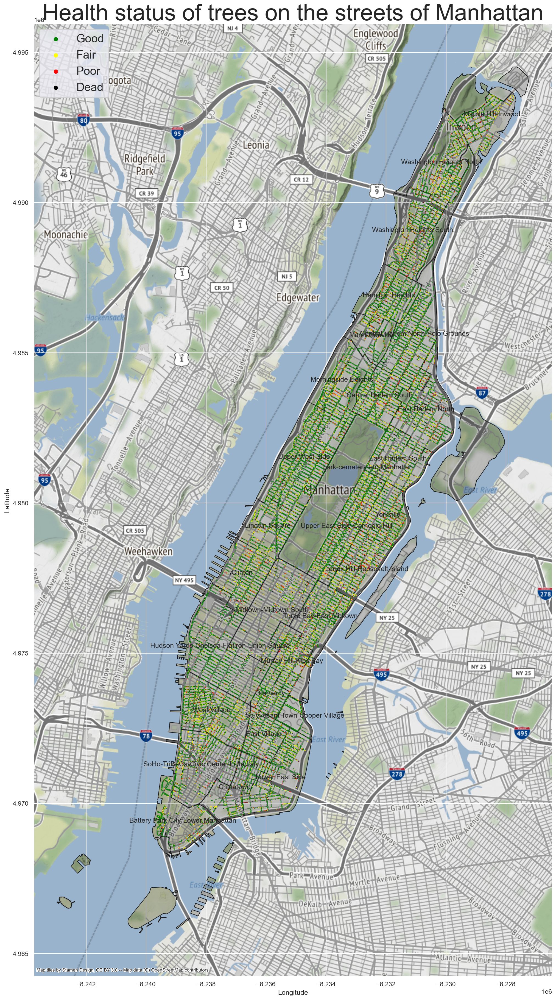

In [136]:
ax = neighborhoods_man.plot(figsize=(30, 30), facecolor = (0,0,0,0.2), 
                            edgecolor='k') #Plot the Manhattan map
#Plot the trees with 'Good' health status
trees_gdf[trees_gdf['health'] == 'Good'].plot(ax = ax, markersize = 0.1, color = 'green', label = 'Good')
#Plot the trees with 'Fair' health status
trees_gdf[trees_gdf['health'] == 'Fair'].plot(ax = ax, markersize = 0.1, color = 'yellow', 
                                              label = 'Fair')
#Plot the trees with 'Poor' health status
trees_gdf[trees_gdf['health'] == 'Poor'].plot(ax = ax, markersize = 0.1, color = 'red', 
                                              label = 'Poor')
#Plot the trees with 'Dead' health status
trees_gdf[trees_gdf['health'] == 'Dead'].plot(ax = ax, markersize = 0.1, color = 'black', 
                                              label = 'Dead')
#add basemap (real satelite map) to the Manhattan map
cx.add_basemap(ax)
#Put the name of neighborhoods in the visualization.
neighborhoods_man.apply(lambda x: ax.annotate(text=x['ntaname'], xy=x.geometry.centroid.coords[0], ha='center'), axis=1);
#Adding legends
plt.legend(loc='upper left',markerscale=20,prop={'size': 20})
#Adding axes labels and visualization title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Health status of trees on the streets of Manhattan',loc='center',fontsize=40)
#Show the visualization
plt.show()

## 4. What ten tree species would you recommend the city plant in the future?

To answer this question, I will specify tree species with high number of `'Good'` and `'Fair'` health status overall and relative to their `'Poor'` number of trees.
<br> However, I want to know trees with `'Poor'` health status is the consequence of their inner characteristics (e.g. weakly adaptable to the climate of Manhattan), or they are harmed by external factors <br>(recorded in the `'root_stone','root_grate','root_other','trunk_wire','trnk_light'`,<br>`'trnk_other','brch_light','brch_shoe','brch_other'`columns)
<br> To know this, I will calculate the correlation between 'Health' and the values in above columns.

In [137]:
#Creating the new dataframe
trees_cor = trees.copy()
trees_cor.head()

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
0,190422,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978482e+06,-8.235967e+06
1,190426,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978507e+06,-8.236010e+06
2,208649,9,OnCurb,American linden,Alive,Good,No,Yes,No,No,No,No,No,No,No,10019,MN15,Clinton,4.977406e+06,-8.236228e+06
3,193310,14,OnCurb,honeylocust,Alive,Good,No,No,Yes,No,No,Yes,No,No,Yes,10021,MN40,Upper East Side-Carnegie Hill,4.978795e+06,-8.233240e+06
4,199760,4,OnCurb,willow oak,Alive,Fair,No,No,No,No,No,No,No,No,No,10024,MN12,Upper West Side,4.980253e+06,-8.235523e+06


In [138]:
#Choose the columns with extenal factors
cols = ['root_stone','root_grate','root_other','trunk_wire','trnk_light','trnk_other',
       'brch_light','brch_shoe','brch_other']

In [139]:
trees_cor[cols].head()

,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other
0,No,No,No,No,No,No,No,No,No
1,No,No,No,No,No,No,No,No,No
2,No,Yes,No,No,No,No,No,No,No
3,No,No,Yes,No,No,Yes,No,No,Yes
4,No,No,No,No,No,No,No,No,No


In [140]:
#Replace 'No' and 'Yes' with 0 and 1
trees_cor[cols] = trees_cor[cols].replace({'No':0, 'Yes':1})

In [141]:
#Replace health status indications with integer numbers (the lower the number the better health status)
trees_cor['health'] = trees_cor['health'].replace({'Good':0, 'Fair':1,
                                                   'Poor':2,'Dead':3})

In [142]:
#Replace the 'curb_loc' values
trees_cor['curb_loc'] = trees_cor['curb_loc'].replace({'OnCurb':1,'OffsetFromCurb':0})

In [143]:
trees_cor.head()

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
0,190422,11,1,honeylocust,Alive,0,0,0,0,0,0,0,0,0,0,10023,MN14,Lincoln Square,4.978482e+06,-8.235967e+06
1,190426,11,1,honeylocust,Alive,0,0,0,0,0,0,0,0,0,0,10023,MN14,Lincoln Square,4.978507e+06,-8.236010e+06
2,208649,9,1,American linden,Alive,0,0,1,0,0,0,0,0,0,0,10019,MN15,Clinton,4.977406e+06,-8.236228e+06
3,193310,14,1,honeylocust,Alive,0,0,0,1,0,0,1,0,0,1,10021,MN40,Upper East Side-Carnegie Hill,4.978795e+06,-8.233240e+06
4,199760,4,1,willow oak,Alive,1,0,0,0,0,0,0,0,0,0,10024,MN12,Upper West Side,4.980253e+06,-8.235523e+06


In [144]:
#Choose the columns to calculate correlation coefficients
cols_2 = ['tree_dbh','curb_loc','health','root_stone','root_grate','root_other','trunk_wire',
          'trnk_light','trnk_other','brch_light','brch_shoe','brch_other']
trees_cor = trees_cor[cols_2]
trees_cor.head()

,tree_dbh,curb_loc,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other
0,11,1,0,0,0,0,0,0,0,0,0,0
1,11,1,0,0,0,0,0,0,0,0,0,0
2,9,1,0,0,1,0,0,0,0,0,0,0
3,14,1,0,0,0,1,0,0,1,0,0,1
4,4,1,1,0,0,0,0,0,0,0,0,0


In [145]:
#Calculate the correlation coefficient
trees_cor_coef = trees_cor.corr()
trees_cor_coef.head()

,tree_dbh,curb_loc,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other
tree_dbh,1.000000,-0.137054,-0.163162,0.147918,-0.015439,0.054946,-0.010394,0.002726,0.028458,0.007225,0.014420,0.010206
curb_loc,-0.137054,1.000000,0.043001,0.017643,0.001956,0.035678,0.010163,0.004477,0.022193,0.011578,-0.007928,0.039321
health,-0.163162,0.043001,1.000000,-0.015178,0.006789,0.016716,0.010634,-0.005185,0.081078,0.010274,0.005723,0.110771
root_stone,0.147918,0.017643,-0.015178,1.000000,-0.057197,0.063116,0.032562,0.018735,0.084480,0.056076,0.024273,0.096212
root_grate,-0.015439,0.001956,0.006789,-0.057197,1.000000,0.035258,0.003108,0.043105,0.049149,0.023126,0.001686,0.039561


In [146]:
#Choose only the coefficients with health status
trees_cor_coef_health = trees_cor_coef['health'].to_frame()
trees_cor_coef_health.sort_values('health',ascending=False, inplace = True)
trees_cor_coef_health.head()

,health
health,1.000000
brch_other,0.110771
trnk_other,0.081078
curb_loc,0.043001
root_other,0.016716


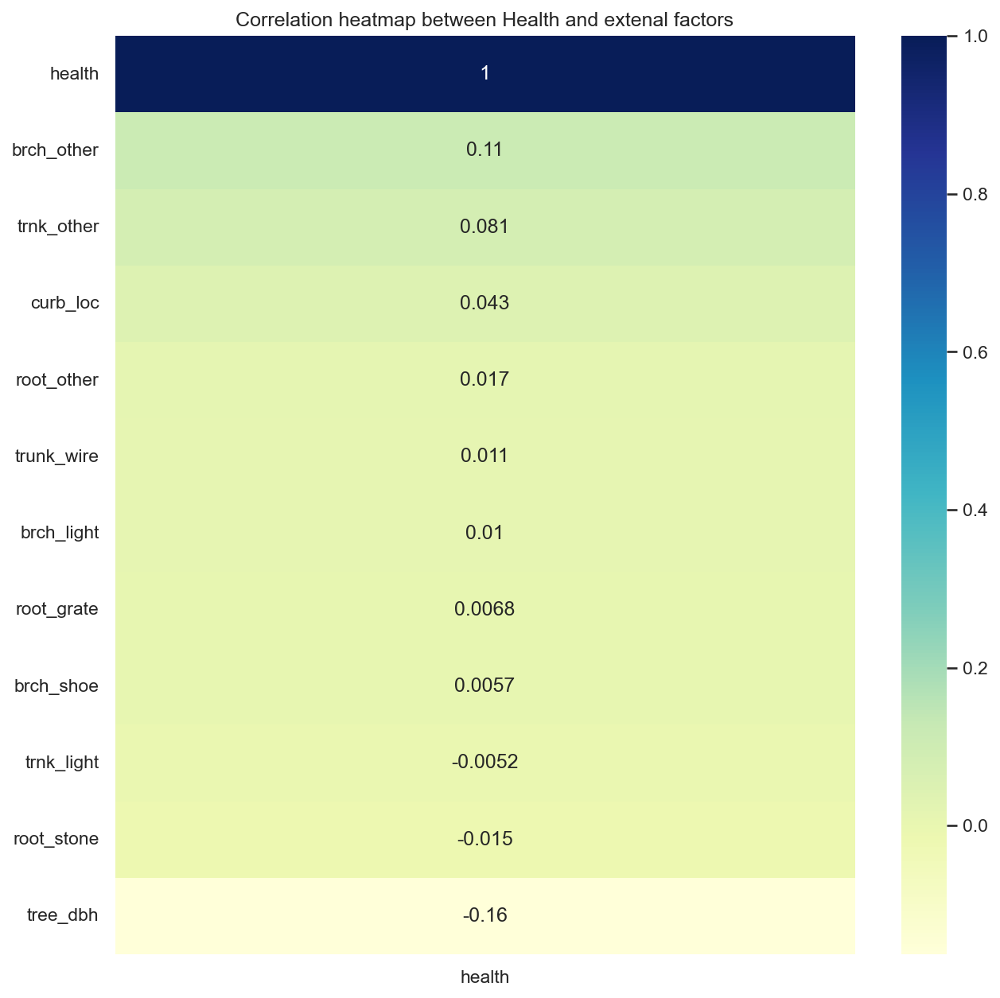

In [147]:
#Plotting the correlation heatmap
import seaborn as sns
sns.set(rc={'figure.figsize':(10,10)})
sns.heatmap(trees_cor_coef_health, cmap="YlGnBu", annot = True)
plt.title('Correlation heatmap between Health and extenal factors')
plt.show()

We don't see any strong relationships between health and extenal factors that harm the trees.
<br>So the health status of trees is mostly decided by their inner characteristics.
<br> With this information, we can see which species have high number of `'Good'` and `'Fair'` trees and recommend Manhattan to plant them more in the future.

In [148]:
#Create a new dataframe
trees_by_health = trees.copy()
trees_by_health.head(10)

,tree_id,tree_dbh,curb_loc,spc_common,status,health,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,postcode,nta,nta_name,latitude,longitude
0,190422,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978482e+06,-8.235967e+06
1,190426,11,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978507e+06,-8.236010e+06
2,208649,9,OnCurb,American linden,Alive,Good,No,Yes,No,No,No,No,No,No,No,10019,MN15,Clinton,4.977406e+06,-8.236228e+06
3,193310,14,OnCurb,honeylocust,Alive,Good,No,No,Yes,No,No,Yes,No,No,Yes,10021,MN40,Upper East Side-Carnegie Hill,4.978795e+06,-8.233240e+06
4,199760,4,OnCurb,willow oak,Alive,Fair,No,No,No,No,No,No,No,No,No,10024,MN12,Upper West Side,4.980253e+06,-8.235523e+06
5,201555,9,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10002,MN27,Chinatown,4.971395e+06,-8.236510e+06
6,187056,7,OnCurb,honeylocust,Alive,Good,No,Yes,No,No,No,Yes,No,No,No,10023,MN14,Lincoln Square,4.978534e+06,-8.235597e+06
7,187058,5,OnCurb,honeylocust,Alive,Good,No,Yes,No,No,No,Yes,No,No,No,10023,MN14,Lincoln Square,4.978509e+06,-8.235552e+06
8,190423,12,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978488e+06,-8.235978e+06
9,190425,13,OnCurb,honeylocust,Alive,Good,No,No,No,No,No,No,No,No,No,10023,MN14,Lincoln Square,4.978502e+06,-8.236003e+06


In [149]:
#Group by Health and species name
trees_by_health_count = trees_by_health.groupby(['spc_common','health'])['health'].count().reset_index(name="count")
trees_by_health_count.head()

,spc_common,health,count
0,'Schubert' chokecherry,Fair,40
1,'Schubert' chokecherry,Good,111
2,'Schubert' chokecherry,Poor,12
3,American beech,Fair,4
4,American beech,Good,15


In [150]:
trees_poor = trees_by_health_count[trees_by_health_count['health'] == 'Poor'].rename(columns={"count": "poor_count"}).drop(columns=['health'])
trees_good = trees_by_health_count[trees_by_health_count['health'] == 'Good'].rename(columns={"count": "good_count"}).drop(columns=['health'])
trees_fair = trees_by_health_count[trees_by_health_count['health'] == 'Fair'].rename(columns={"count": "fair_count"}).drop(columns=['health'])
trees_total = trees_poor.merge(trees_good,how ='outer',on = 'spc_common').merge(trees_fair,how ='outer',on = 'spc_common')
trees_total.sort_values('good_count',ascending = False).head(10)

,spc_common,poor_count,good_count,fair_count
62,honeylocust,205.0,10958.0,2012.0
9,Callery pear,441.0,5382.0,1474.0
55,ginkgo,491.0,4386.0,982.0
74,pin oak,134.0,3731.0,719.0
29,Sophora,186.0,3554.0,713.0
21,Japanese zelkova,204.0,2773.0,619.0
24,London planetree,381.0,2597.0,1144.0
66,littleleaf linden,461.0,2076.0,796.0
2,American elm,78.0,1361.0,259.0
6,American linden,184.0,1020.0,379.0


In [151]:
#Adding good and fair tree number
trees_total['good_fair_tree_number'] = trees_total['good_count'] + trees_total['fair_count']
#Adding total tree number column
trees_total['total_tree_number'] = trees_total['good_count'] + trees_total['fair_count']+trees_total['poor_count']
#Adding great health rate column
trees_total['great_health_rate'] = (trees_total['good_fair_tree_number']/trees_total['total_tree_number']*100).map('{:,.2f}'.format)

I calculate `'great_health_rate'` metric with total numbers of `'Good'` and `'Fair'` trees divided by total number of tree species. This metric can provide a better look when specifying which species can be developed well on the conditions of Manhattan streets.

In [152]:
trees_total.sort_values('good_fair_tree_number',ascending = False, inplace = True)
trees_total.head(11)

,spc_common,poor_count,good_count,fair_count,good_fair_tree_number,total_tree_number,great_health_rate
62,honeylocust,205.0,10958.0,2012.0,12970.0,13175.0,98.44
9,Callery pear,441.0,5382.0,1474.0,6856.0,7297.0,93.96
55,ginkgo,491.0,4386.0,982.0,5368.0,5859.0,91.62
74,pin oak,134.0,3731.0,719.0,4450.0,4584.0,97.08
29,Sophora,186.0,3554.0,713.0,4267.0,4453.0,95.82
24,London planetree,381.0,2597.0,1144.0,3741.0,4122.0,90.76
21,Japanese zelkova,204.0,2773.0,619.0,3392.0,3596.0,94.33
66,littleleaf linden,461.0,2076.0,796.0,2872.0,3333.0,86.17
2,American elm,78.0,1361.0,259.0,1620.0,1698.0,95.41
6,American linden,184.0,1020.0,379.0,1399.0,1583.0,88.38


I recommend Manhattan to choose these tree species to plant in the future due to their high number of great health trees and great health rate: 
- Honey locust
- Callery pear
- Ginkgo
- Pin oak
- Sophora
- London planetree
- Japanese zelkova
- American elm
- American linden
- Northern red oak
I made only 1 replacement from the top 10 `'good_fair_tree_number'`. Littleleaf linden is swapped by Northern red oak, since Littleleaf linden has low great health rate at only 86.17%, which means many trees are in `'Poor'` health status (461 trees), while Northern red oak has a more impressive great health rate at 95.01%.